In [1]:
import os
import pandas as pd
import json
from pathlib import Path

## **Section-01**: Data Integrity Check

In [2]:
DATASET_ROOT = "/kaggle/input/datasets/ajfaisal002/crossmodal-misleading-video-dataset"

TRAIN_META_PATH = f"{DATASET_ROOT}/extracted_text/train_metadata.csv"
TEST_META_PATH = f"{DATASET_ROOT}/extracted_text/test_metadata.csv"

TRAIN_FRAME_PATH = f"{DATASET_ROOT}/extracted_frames/train"
TEST_FRAME_PATH = f"{DATASET_ROOT}/extracted_frames/test"

TRAIN_ANNOT_PATH = f"{DATASET_ROOT}/annotations/train_annotations.json"
TEST_ANNOT_PATH = f"{DATASET_ROOT}/annotations/test_annotations.json"

In [3]:
train_meta = pd.read_csv(TRAIN_META_PATH)
test_meta = pd.read_csv(TEST_META_PATH)

print("Train samples:", len(train_meta))
print("Test samples:", len(test_meta))

train_meta.head()

Train samples: 1600
Test samples: 800


,video_id,has_audio,transcript,ocr_text,category,subcategory
0,IF_001,True,আপনি সিদ্ধান্ত নিয়েছেন একটি নতুন অ্যাপ্লিকেশন...,OR EVEN TAKA ON YOUR FIRST CRAZY TIME,misleading,identity_fabrication
1,IF_002,True,"With a small investment of 30,500 Bangladeshi ...",YES WITH A SMALL INVESTMENT OF BANGLADESH TAKA...,misleading,identity_fabrication
2,IF_003,True,"If they close this page, they can't come back ...",IF THEY CLOSE THIS PAGE AS WILL THEIR CHANCE T...,misleading,identity_fabrication
3,IF_004,True,We tested our product with a small group of vo...,AND EACH OF THEM EARNED OVER BANGLADESHI TAKA ...,misleading,identity_fabrication
4,IF_005,True,I am ready to give you your money back from my...,MONEY BACK FROM MY POCKET BANGLADESHI TAKA,misleading,identity_fabrication


In [4]:
print("\nTrain Category Distribution")
print(train_meta["category"].value_counts())

print("\nTrain Subcategory Distribution")
print(train_meta["subcategory"].value_counts())


Train Category Distribution
category
misleading    800
safe          800
Name: count, dtype: int64

Train Subcategory Distribution
subcategory
identity_fabrication                200
perception_manipulation             200
scientifically_unrealistic_scene    200
surreal_content                     200
Name: count, dtype: int64


In [5]:
frame_root = Path(TRAIN_FRAME_PATH)

sample_video = train_meta.iloc[0]["video_id"]

sample_frame_dir = frame_root / sample_video

frames = list(sample_frame_dir.glob("*.jpg"))

print("Sample video:", sample_video)
print("Frame count:", len(frames))
print("Example frame:", frames[0])

Sample video: IF_001
Frame count: 16
Example frame: /kaggle/input/datasets/ajfaisal002/crossmodal-misleading-video-dataset/extracted_frames/train/IF_001/frame_10.jpg


In [6]:
import random

sample_ids = random.sample(list(train_meta["video_id"]), 5)

for vid in sample_ids:
    
    frame_dir = Path(TRAIN_FRAME_PATH) / vid
    frame_count = len(list(frame_dir.glob("*.jpg")))
    
    print(f"{vid} -> {frame_count} frames")

SAFE_263 -> 16 frames
PM_086 -> 16 frames
SAFE_087 -> 16 frames
SUS_048 -> 16 frames
IF_091 -> 16 frames


In [7]:
train_meta[["video_id", "has_audio", "transcript"]].head(10)

,video_id,has_audio,transcript
0,IF_001,True,আপনি সিদ্ধান্ত নিয়েছেন একটি নতুন অ্যাপ্লিকেশন...
1,IF_002,True,"With a small investment of 30,500 Bangladeshi ..."
2,IF_003,True,"If they close this page, they can't come back ..."
3,IF_004,True,We tested our product with a small group of vo...
4,IF_005,True,I am ready to give you your money back from my...
5,IF_006,True,"So far, there has not been a single person who..."
6,IF_007,True,"I've decided to create a new application, Craz..."
7,IF_008,False,NaN
8,IF_009,True,We the people stand united now
9,IF_010,False,NaN


In [8]:
train_meta[["video_id", "ocr_text"]].head(10)

,video_id,ocr_text
0,IF_001,OR EVEN TAKA ON YOUR FIRST CRAZY TIME
1,IF_002,YES WITH A SMALL INVESTMENT OF BANGLADESH TAKA...
2,IF_003,IF THEY CLOSE THIS PAGE AS WILL THEIR CHANCE T...
3,IF_004,AND EACH OF THEM EARNED OVER BANGLADESHI TAKA ...
4,IF_005,MONEY BACK FROM MY POCKET BANGLADESHI TAKA
5,IF_006,NO SPECIAL SKILLS ARE REQUIRED IF THEY WATCH T...
6,IF_007,MANY PLAYERS HAVE BOUGHT CARS AND HOUSES FOR T...
7,IF_008,NaN
8,IF_009,WE THE PEOPLE STAND NO NO KINGS NO KING S NO
9,IF_010,NaN


In [9]:
with open(TRAIN_ANNOT_PATH) as f:
    train_annotations = json.load(f)

with open(TEST_ANNOT_PATH) as f:
    test_annotations = json.load(f)

print("Train annotations:", len(train_annotations))
print("Test annotations:", len(test_annotations))

Train annotations: 1600
Test annotations: 800


In [10]:
print(train_annotations[0])


print(train_annotations[956])

{'video_id': 'IF_001', 'category': 'misleading', 'subcategory': 'identity_fabrication', 'audio_available': True, 'visual_description': 'An elderly man with gray hair is seated on an ornate white carved chair, speaking directly toward the camera. The background features wooden interior decor. The scene remains static, and subtitle-style text appears at the bottom of the screen.', 'audio_transcript': "I've decided to create a new application. Crazy time. By investing just 5 taka, you can win 50,000 or even 100,000 taka on your first day.", 'ocr_text': ['due to the current crisis in the country', "I've decided to create a new application", 'crazy time', 'by investing just 5 taka you can win 50,000'], 'scene_summary': 'A man appears to be giving an announcement while subtitles promote a financial scheme claiming that a 5-taka investment can generate 50,000–100,000 taka. These claims are unrealistic and represent deceptive financial misinformation.', 'explanation': {'visual_cues': 'Static i

In [11]:
print("\nDATASET SUMMARY")
print("--------------")

print("Train Videos:", len(train_meta))
print("Test Videos:", len(test_meta))

print("Train Annotations:", len(train_annotations))
print("Test Annotations:", len(test_annotations))

print("\nDataset integrity check completed successfully.")


DATASET SUMMARY
--------------
Train Videos: 1600
Test Videos: 800
Train Annotations: 1600
Test Annotations: 800

Dataset integrity check completed successfully.


## **Section-02**: Multimodal DataLoader

In [12]:
!pip install transformers timm --quiet

In [13]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

from PIL import Image
import numpy as np
import pandas as pd
from pathlib import Path

In [14]:
# Label Mapping

label_map = {
    "safe":0,
    "identity_fabrication":1,
    "perception_manipulation":2,
    "scientifically_unrealistic_scene":3,
    "surreal_content":4
}

In [15]:
# Image Transform

image_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

In [16]:
class CrossModalDataset(Dataset):

    def __init__(self, metadata, frame_root):

        self.metadata = metadata
        self.frame_root = Path(frame_root)

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):

        row = self.metadata.iloc[idx]

        video_id = row["video_id"]

        frame_dir = self.frame_root / video_id

        frames = sorted(list(frame_dir.glob("*.jpg")))[:16]

        images = []

        for f in frames:
            img = Image.open(f).convert("RGB")
            img = image_transform(img)
            images.append(img)

        images = torch.stack(images)

        transcript = str(row["transcript"])
        ocr_text = str(row["ocr_text"])

        text_input = transcript + " " + ocr_text

        if row["category"] == "safe":
            label = label_map["safe"]
        else:
            label = label_map[row["subcategory"]]

        return {
            "images": images,
            "text": text_input,
            "label": label,
            "video_id": video_id
        }

In [17]:
train_dataset = CrossModalDataset(
    train_meta,
    TRAIN_FRAME_PATH
)

test_dataset = CrossModalDataset(
    test_meta,
    TEST_FRAME_PATH
)

print("Train dataset:", len(train_dataset))
print("Test dataset:", len(test_dataset))

Train dataset: 1600
Test dataset: 800


In [18]:
sample = train_dataset[0]

print("Video ID:", sample["video_id"])
print("Image tensor shape:", sample["images"].shape)
print("Text:", sample["text"][:120])
print("Label:", sample["label"])

Video ID: IF_001
Image tensor shape: torch.Size([16, 3, 224, 224])
Text: আপনি সিদ্ধান্ত নিয়েছেন একটি নতুন অ্যাপ্লিকেশন ক্রেজি টাইম তৈরি করার। মাত্র ৫ টাকা বিনিয়োগ করে আপনি প্রথম দিনেই ৫০,০০০ 
Label: 1


In [19]:
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=2, shuffle=False, num_workers=2, pin_memory=True)
print("Dataloader ready.")

Dataloader ready.


## Section-03: Multimodal Neural Network

In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from transformers import CLIPModel, AutoTokenizer, AutoModel
from torch.cuda.amp import autocast, GradScaler

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
tokenizer = AutoTokenizer.from_pretrained("roberta-base")
roberta = AutoModel.from_pretrained("roberta-base").to(device)

# Freeze encoders to save memory
for p in clip.parameters():
    p.requires_grad = False
for p in roberta.parameters():
    p.requires_grad = False

clip.eval()
roberta.eval()

print("Encoders loaded + frozen.")

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaModel LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Encoders loaded + frozen.


## Section-04: Training Setup

In [21]:
def clip_vision_embed(pixel_values):
    """
    Always returns a TENSOR embedding, compatible across HF versions.
    """
    outputs = clip.vision_model(pixel_values=pixel_values)

    if hasattr(outputs, "pooler_output") and outputs.pooler_output is not None:
        return outputs.pooler_output  # (B, hidden)

    # fallback
    return outputs.last_hidden_state.mean(dim=1)  # (B, hidden)

In [22]:
# Take one batch to detect fusion dimension safely
batch0 = next(iter(train_loader))
images0 = batch0["images"]                      # (B,16,3,224,224)
texts0  = list(batch0["text"])

B = images0.size(0)
images0 = images0.view(-1,3,224,224).to(device) # (B*16,3,224,224)

with torch.no_grad():
    img_feat0 = clip_vision_embed(images0)      # (B*16, Dimg)
img_feat0 = img_feat0.view(B,16,-1).mean(dim=1) # (B, Dimg)

with torch.no_grad():
    toks0 = tokenizer(texts0, padding=True, truncation=True, return_tensors="pt").to(device)
    txt_out0 = roberta(**toks0)
    txt_feat0 = txt_out0.last_hidden_state[:,0,:]  # (B,768)

fusion_dim = img_feat0.shape[1] + txt_feat0.shape[1]
print("Detected dims -> image:", img_feat0.shape[1], "text:", txt_feat0.shape[1], "fusion:", fusion_dim)

Detected dims -> image: 768 text: 768 fusion: 1536


In [23]:
class FusionClassifier(nn.Module):
    def __init__(self, fusion_dim, num_classes=5):
        super().__init__()
        self.classifier = nn.Sequential(
            nn.Linear(fusion_dim, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, images, texts):
        b = images.size(0)
        images = images.view(-1, 3, 224, 224).to(device)

        with torch.no_grad():
            img_feat = clip_vision_embed(images)          # (B*16, Dimg)
        img_feat = img_feat.view(b, 16, -1).mean(dim=1)   # (B, Dimg)

        with torch.no_grad():
            toks = tokenizer(list(texts), padding=True, truncation=True, return_tensors="pt").to(device)
            txt_out = roberta(**toks)
            txt_feat = txt_out.last_hidden_state[:, 0, :] # (B,768)

        fusion = torch.cat([img_feat, txt_feat], dim=1)   # (B, fusion_dim)
        return self.classifier(fusion)

model = FusionClassifier(fusion_dim=fusion_dim, num_classes=5).to(device)
print("Fusion model created.")

Fusion model created.


In [24]:
criterion = nn.CrossEntropyLoss()

# only classifier has trainable parameters
optimizer = optim.Adam(model.classifier.parameters(), lr=1e-3)

scaler = GradScaler()
print("Optimizer created. Trainable params:", sum(p.numel() for p in model.parameters() if p.requires_grad))

Optimizer created. Trainable params: 789509


/tmp/ipykernel_23/311204766.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [25]:
EPOCHS = 5

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0

    for batch in tqdm(train_loader):
        images = batch["images"]
        texts = batch["text"]
        labels = batch["label"].to(device)

        optimizer.zero_grad(set_to_none=True)

        with autocast():
            outputs = model(images, texts)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{EPOCHS} Loss: {total_loss/len(train_loader):.4f}")

  0%|          | 0/800 [00:00<?, ?it/s]/tmp/ipykernel_23/3446227605.py:14: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
100%|██████████| 800/800 [01:30<00:00,  8.88it/s]


Epoch 1/5 Loss: 0.5573


100%|██████████| 800/800 [00:56<00:00, 14.14it/s]


Epoch 2/5 Loss: 0.3003


100%|██████████| 800/800 [00:56<00:00, 14.23it/s]


Epoch 3/5 Loss: 0.2262


100%|██████████| 800/800 [00:56<00:00, 14.23it/s]


Epoch 4/5 Loss: 0.1774


100%|██████████| 800/800 [00:56<00:00, 14.21it/s]

Epoch 5/5 Loss: 0.1334


In [26]:
from torch.amp import autocast

In [27]:
!pip install scikit-learn --quiet

In [28]:
import numpy as np
import torch
from tqdm import tqdm
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pandas as pd

In [29]:
id2label = {
    0: "safe",
    1: "identity_fabrication",
    2: "perception_manipulation",
    3: "scientifically_unrealistic_scene",
    4: "surreal_content"
}
label2id = {v:k for k,v in id2label.items()}

In [30]:
from torch.amp import autocast

model.eval()

all_preds = []
all_labels = []
all_video_ids = []

with torch.no_grad():
    for batch in tqdm(test_loader):

        images = batch["images"]
        texts  = batch["text"]
        labels = batch["label"].to(device)

        with autocast('cuda'):
            logits = model(images, texts)

        preds = torch.argmax(logits, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_video_ids.extend(batch["video_id"])

acc = accuracy_score(all_labels, all_preds)
print("TEST Accuracy:", acc)

100%|██████████| 400/400 [00:42<00:00,  9.46it/s]

TEST Accuracy: 0.72


In [31]:
print("\nClassification Report (TEST):\n")
print(classification_report(
    all_labels, all_preds,
    target_names=[id2label[i] for i in range(5)],
    digits=4
))


Classification Report (TEST):

                                  precision    recall  f1-score   support

                            safe     0.8414    0.7425    0.7888       400
            identity_fabrication     0.8088    0.5500    0.6548       100
         perception_manipulation     0.5827    0.7400    0.6520       100
scientifically_unrealistic_scene     0.4837    0.8900    0.6268       100
                 surreal_content     0.8971    0.6100    0.7262       100

                        accuracy                         0.7200       800
                       macro avg     0.7227    0.7065    0.6897       800
                    weighted avg     0.7672    0.7200    0.7269       800



In [32]:
cm = confusion_matrix(all_labels, all_preds)

cm_df = pd.DataFrame(
    cm,
    index=[f"true_{id2label[i]}" for i in range(5)],
    columns=[f"pred_{id2label[i]}" for i in range(5)]
)

cm_df

,pred_safe,pred_identity_fabrication,pred_perception_manipulation,pred_scientifically_unrealistic_scene,pred_surreal_content
true_safe,297,10,26,60,7
true_identity_fabrication,23,55,19,3,0
true_perception_manipulation,12,3,74,11,0
true_scientifically_unrealistic_scene,4,0,7,89,0
true_surreal_content,17,0,1,21,61


In [33]:
pred_df = pd.DataFrame({
    "video_id": all_video_ids,
    "true_label": [id2label[x] for x in all_labels],
    "pred_label": [id2label[x] for x in all_preds],
})

pred_df.to_csv("test_predictions_v1.csv", index=False)
print("Saved: test_predictions_v1.csv")
pred_df.head()

Saved: test_predictions_v1.csv


,video_id,true_label,pred_label
0,TEST_IF_001,identity_fabrication,identity_fabrication
1,TEST_IF_002,identity_fabrication,identity_fabrication
2,TEST_IF_003,identity_fabrication,identity_fabrication
3,TEST_IF_004,identity_fabrication,identity_fabrication
4,TEST_IF_005,identity_fabrication,identity_fabrication


I trained a first baseline multimodal fusion model (CLIP vision + RoBERTa text, frozen encoders, fusion MLP) on 1600 training videos.
I evaluated on 800 fully unseen test videos and produced accuracy and per-class precision/recall/F1, plus a confusion matrix and saved test predictions.

## SECTION 6 — Explainability (XAI)

In [34]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from pathlib import Path
from PIL import Image

def get_row_by_video_id(meta_df, video_id):
    row = meta_df[meta_df["video_id"] == video_id]
    if len(row) == 0:
        raise ValueError(f"video_id {video_id} not found in metadata")
    return row.iloc[0]

def load_16_frames(video_id, split="test"):
    frame_root = TEST_FRAME_PATH if split=="test" else TRAIN_FRAME_PATH
    frame_dir = Path(frame_root) / video_id
    frame_files = sorted(list(frame_dir.glob("*.jpg")))[:16]
    imgs = []
    for f in frame_files:
        img = Image.open(f).convert("RGB")
        img = image_transform(img)   # your existing transform (224x224 + ToTensor)
        imgs.append(img)
    return torch.stack(imgs), frame_files  # (16,3,224,224), list(paths)

In [35]:
import torch.nn.functional as F
from torch.amp import autocast

def predict_one(images_16, text):
    # images_16: (16,3,224,224)
    model.eval()
    with torch.no_grad():
        images_16 = images_16.unsqueeze(0)  # (1,16,3,224,224)
        with autocast('cuda'):
            logits = model(images_16, [text])
        probs = F.softmax(logits, dim=1).cpu().numpy()[0]
        pred = int(np.argmax(probs))
    return probs, pred

In [36]:
def explain_ablation(video_id, split="test"):
    meta = test_meta if split=="test" else train_meta
    row = get_row_by_video_id(meta, video_id)

    images_16, frame_files = load_16_frames(video_id, split=split)

    transcript = "" if pd.isna(row["transcript"]) else str(row["transcript"])
    ocr = "" if pd.isna(row["ocr_text"]) else str(row["ocr_text"])
    full_text = (transcript + " " + ocr).strip()

    probs_full, pred_full = predict_one(images_16, full_text)

    # Text ablations
    probs_trans_only, _ = predict_one(images_16, transcript.strip())
    probs_ocr_only, _   = predict_one(images_16, ocr.strip())

    # Vision ablation: replace vision with zeros (keeps shape)
    zeros_vision = torch.zeros_like(images_16)
    probs_text_only, _ = predict_one(zeros_vision, full_text)

    # Text ablation: empty text
    probs_vision_only, _ = predict_one(images_16, "")

    print("VIDEO:", video_id)
    print("Pred(full):", id2label[pred_full], " | prob:", probs_full[pred_full].round(4))
    print("\nAblation (prob of predicted class):")
    print("Full (Vision+Text):", probs_full[pred_full].round(4))
    print("Vision only:",       probs_vision_only[pred_full].round(4))
    print("Text only:",         probs_text_only[pred_full].round(4))
    print("Transcript only:",   probs_trans_only[pred_full].round(4))
    print("OCR only:",          probs_ocr_only[pred_full].round(4))

    return {
        "video_id": video_id,
        "pred_label": id2label[pred_full],
        "probs_full": probs_full,
        "pred_full": pred_full,
        "transcript": transcript,
        "ocr": ocr,
        "frame_files": frame_files,
        "images_16": images_16
    }

In [37]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def show_all_16_frames(explain_obj, scores=None):
    frame_files = explain_obj["frame_files"]
    pred_cls = explain_obj["pred_full"]

    if scores is None:
        # compute scores for all 16 frames
        images_16 = explain_obj["images_16"]
        transcript = explain_obj["transcript"]
        ocr = explain_obj["ocr"]
        full_text = (transcript + " " + ocr).strip()

        scores = []
        for i in range(16):
            one_frame = images_16[i].unsqueeze(0).repeat(16,1,1,1)  # (16,3,224,224)
            probs, _ = predict_one(one_frame, full_text)
            scores.append(float(probs[pred_cls]))
        scores = np.array(scores)

    # Plot 4x4
    plt.figure(figsize=(14, 14))
    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = Image.open(frame_files[i]).convert("RGB")
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"F{i+1:02d}  s={scores[i]:.2f}")
    plt.suptitle(f"All 16 frames | predicted: {id2label[pred_cls]}", fontsize=16)
    plt.show()

    return scores

In [38]:
def one_line_explanation(exp, ablation_printed=False):
    pred_label = exp["pred_label"]
    transcript = exp["transcript"]
    ocr = exp["ocr"]

    # Quick cues summary
    has_transcript = (transcript is not None) and (str(transcript).strip() != "") and (str(transcript).strip().lower() != "nan")
    has_ocr = (ocr is not None) and (str(ocr).strip() != "") and (str(ocr).strip().lower() != "nan")

    # Compute simple modality dominance using ablation (re-run quickly)
    images_16 = exp["images_16"]
    full_text = ((transcript if has_transcript else "") + " " + (ocr if has_ocr else "")).strip()

    probs_full, pred_full = predict_one(images_16, full_text)
    probs_vision_only, _  = predict_one(images_16, "")
    probs_text_only, _    = predict_one(torch.zeros_like(images_16), full_text)

    p_full = float(probs_full[pred_full])
    p_v = float(probs_vision_only[pred_full])
    p_t = float(probs_text_only[pred_full])

    # Decide dominant cue source (simple)
    if p_v > p_t:
        dominant = "visual cues across frames"
    elif p_t > p_v:
        dominant = "textual cues (ASR/OCR)"
    else:
        dominant = "both visual and textual cues"

    # Build single line explanation
    if pred_label == "safe":
        reason = f"the content is consistent and non-manipulative, supported by {dominant}"
        return f"The video is safe because {reason}."
    else:
        # Map class label to short description
        class_reason = {
            "identity_fabrication": "it contains fabricated identity/claims (often scam-like or false attribution)",
            "perception_manipulation": "it uses emotionally manipulative framing designed to trigger fear/shock",
            "scientifically_unrealistic_scene": "it shows scenes that violate real-world science/physics/biology",
            "surreal_content": "it presents dream-like or fantasy visuals that depart from real-world realism"
        }
        base = class_reason.get(pred_label, "it shows misleading content patterns")
        return f"The video is misleading ({pred_label}) because {base}, supported by {dominant}."

VIDEO: TEST_SAFE_077
Pred(full): safe  | prob: 0.6245

Ablation (prob of predicted class):
Full (Vision+Text): 0.6245
Vision only: 0.0447
Text only: 0.005
Transcript only: 0.822
OCR only: 0.0303
The video is safe because the content is consistent and non-manipulative, supported by visual cues across frames.


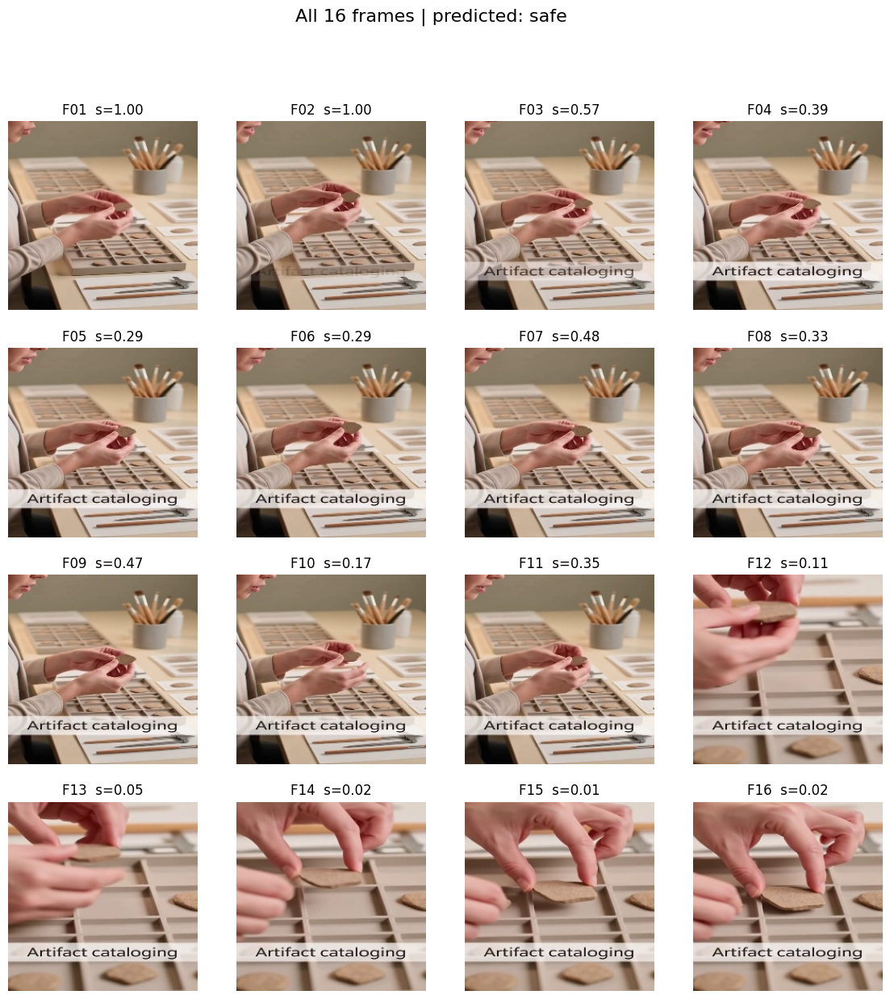

In [39]:
vid = "TEST_SAFE_077"
exp = explain_ablation(vid, split="test")
print(one_line_explanation(exp))
scores16 = show_all_16_frames(exp)

In [40]:
# =========================
# XAI FINAL CELL (RUN THIS)
# =========================

import re
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

# -------------------------
# Safer constants
# -------------------------
NO_TEXT = "[NO_TEXT]"
GRAY_FRAME_VAL = 0.5  # gray image in [0,1]


# -------------------------
# Show all 16 frames + scores
# -------------------------
def show_all_16_frames(exp, scores=None):
    frame_files = exp["frame_files"]
    pred_cls = exp["pred_full"]

    if scores is None:
        images_16 = exp["images_16"]
        transcript = exp["transcript"]
        ocr = exp["ocr"]
        full_text = ((transcript if transcript else "") + " " + (ocr if ocr else "")).strip()
        if full_text == "":
            full_text = NO_TEXT

        scores = []
        for i in range(16):
            one_frame = images_16[i].unsqueeze(0).repeat(16, 1, 1, 1)  # (16,3,224,224)
            probs, _ = predict_one(one_frame, full_text)
            scores.append(float(probs[pred_cls]))
        scores = np.array(scores)

    plt.figure(figsize=(14, 14))
    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = Image.open(frame_files[i]).convert("RGB")
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"F{i+1:02d}  s={scores[i]:.2f}")
    plt.suptitle(f"All 16 frames | predicted: {id2label[pred_cls]}", fontsize=16)
    plt.show()

    return scores


# -------------------------
# Frame stability summary
# -------------------------
def frame_support_summary(scores, threshold=0.7):
    strong = int((scores >= threshold).sum())
    return strong, len(scores)


# -------------------------
# Safer ablations (no zeros)
# -------------------------
def safe_ablations(images_16, full_text):
    # full
    probs_full, pred_full = predict_one(images_16, full_text)

    # vision-only: keep frames, replace text safely
    probs_vision_only, _ = predict_one(images_16, NO_TEXT)

    # text-only: keep text, replace frames with gray frames (not black zeros)
    gray = torch.full_like(images_16, GRAY_FRAME_VAL)
    probs_text_only, _ = predict_one(gray, full_text)

    return probs_full, probs_vision_only, probs_text_only


# -------------------------
# Evidence extraction helpers
# -------------------------
def _clean_text(t):
    if t is None or (isinstance(t, float) and pd.isna(t)):
        return ""
    t = str(t)
    t = re.sub(r"\s+", " ", t).strip()
    return t

def _pick_evidence(transcript, ocr, max_len=90):
    # Prefer OCR because it is literally visible in frames
    ocr = _clean_text(ocr)
    transcript = _clean_text(transcript)

    if ocr:
        return ("OCR", ocr[:max_len])
    if transcript:
        return ("ASR", transcript[:max_len])
    return ("NONE", "")

# Keyword cues (you can expand later)
CUES = {
    "identity_fabrication": {
        "money_scam": ["invest", "profit", "earning", "win", "taka", "bdt", "offer ends", "limited", "app", "withdraw", "cashback", "bonus"],
        "authority_claim": ["confirmed", "board confirms", "breaking", "official", "leaked", "exclusive", "report says"]
    },
    "perception_manipulation": {
        "fear_shock": ["warning", "danger", "panic", "you will die", "did you understand", "last chance", "don't ignore", "shocking", "terrifying", "fear"],
        "pressure": ["hurry", "right now", "before it's too late", "urgent"]
    },
    "scientifically_unrealistic_scene": {
        "science_violation": ["turned air into liquid", "impossible", "gravity", "teleport", "cure instantly", "time freeze", "magic", "physics", "science"]
    },
    "surreal_content": {
        "fantasy": ["rainbow", "ribbon road", "fantasy", "dream", "cartoon", "magic world", "unreal world"]
    }
}

# -------------------------
# ONE-LINE EXPLANATION (REAL CUES + CLASS REASON)
# -------------------------
def one_line_explanation_strict(exp, scores16=None):
    pred_label = exp["pred_label"]
    transcript = exp.get("transcript", "")
    ocr = exp.get("ocr", "")

    # Use safer ablation to decide dominant modality
    full_text = (_clean_text(transcript) + " " + _clean_text(ocr)).strip()
    if full_text == "":
        full_text = NO_TEXT

    probs_full, probs_v_only, probs_t_only = safe_ablations(exp["images_16"], full_text)
    pred_id = int(np.argmax(probs_full))
    conf = float(np.max(probs_full))

    p_v = float(probs_v_only[pred_id])
    p_t = float(probs_t_only[pred_id])

    if p_v > p_t + 0.05:
        dominant = "visual evidence across frames"
    elif p_t > p_v + 0.05:
        dominant = "text evidence (OCR/ASR)"
    else:
        dominant = "both visual and text evidence"

    # Add frame support if scores provided
    frame_phrase = ""
    if scores16 is not None:
        strong, total = frame_support_summary(scores16, threshold=0.7)
        frame_phrase = f" with {strong}/{total} frames strongly supporting the decision"

    src, ev = _pick_evidence(transcript, ocr)
    ev_lower = ev.lower()

    # SAFE
    if pred_label == "safe":
        if src != "NONE":
            return f'The video is safe because the visible/spoken content is neutral and consistent with the scene (evidence from {src}: "{ev}"){frame_phrase}.'
        return f"The video is safe because it shows a normal, non-deceptive scene{frame_phrase}."

    # Identity Fabrication
    if pred_label == "identity_fabrication":
        scam_hit = any(k in ev_lower for k in CUES["identity_fabrication"]["money_scam"])
        auth_hit = any(k in ev_lower for k in CUES["identity_fabrication"]["authority_claim"])
        if scam_hit:
            return f'The video is misleading (identity_fabrication) because it pushes a likely false/scam-like claim about money/benefits (evidence from {src}: "{ev}"){frame_phrase}.'
        if auth_hit:
            return f'The video is misleading (identity_fabrication) because it presents an unverified authoritative claim as fact (evidence from {src}: "{ev}"){frame_phrase}.'
        return f'The video is misleading (identity_fabrication) because it asserts a claim without reliable grounding (evidence from {src}: "{ev}"){frame_phrase}.'

    # Perception Manipulation
    if pred_label == "perception_manipulation":
        fear_hit = any(k in ev_lower for k in CUES["perception_manipulation"]["fear_shock"])
        press_hit = any(k in ev_lower for k in CUES["perception_manipulation"]["pressure"])
        if fear_hit or press_hit:
            return f'The video is misleading (perception_manipulation) because it uses fear/pressure framing to influence viewers emotionally (evidence from {src}: "{ev}"){frame_phrase}.'
        return f'The video is misleading (perception_manipulation) because it tries to shape perception using emotional framing rather than facts (evidence from {src}: "{ev}"){frame_phrase}.'

    # Scientifically Unrealistic Scene
    if pred_label == "scientifically_unrealistic_scene":
        sci_hit = any(k in ev_lower for k in CUES["scientifically_unrealistic_scene"]["science_violation"])
        if sci_hit:
            return f'The video is misleading (scientifically_unrealistic_scene) because it claims/shows an impossible scientific event (evidence from {src}: "{ev}"){frame_phrase}.'
        return f'The video is misleading (scientifically_unrealistic_scene) because the scene implies behavior that violates real-world science/physics/biology (evidence from {src}: "{ev}"){frame_phrase}.'

    # Surreal Content
    if pred_label == "surreal_content":
        fan_hit = any(k in ev_lower for k in CUES["surreal_content"]["fantasy"])
        if fan_hit:
            return f'The video is misleading (surreal_content) because it depicts fantasy-like unreal visuals rather than real-world footage (evidence from {src}: "{ev}"){frame_phrase}.'
        return f'The video is misleading (surreal_content) because the visuals are stylized/unreal and not realistic (evidence from {src}: "{ev}"){frame_phrase}.'

    # fallback
    return f'The video is misleading ({pred_label}) because it contains misleading cues (evidence from {src}: "{ev}"){frame_phrase}.'


# -------------------------
# SINGLE FUNCTION YOU CALL
# -------------------------
def run_xai(video_id, split="test"):
    exp = explain_ablation(video_id, split=split)     # must exist from your earlier code
    scores16 = show_all_16_frames(exp)               # shows 16 frames
    line = one_line_explanation_strict(exp, scores16=scores16)
    print("\nONE-LINE EXPLANATION:")
    print(line)
    print("\nFrame support:", f"{frame_support_summary(scores16, 0.7)[0]}/16 frames >= 0.7 score")
    return exp, scores16, line


# -------------------------
# Example usage
# -------------------------
# Change this to any ID you want:
# exp, scores16, line = run_xai("TEST_PM_059", split="test")

VIDEO: TEST_PM_099
Pred(full): perception_manipulation  | prob: 0.999

Ablation (prob of predicted class):
Full (Vision+Text): 0.999
Vision only: 0.999
Text only: 0.4229
Transcript only: 0.999
OCR only: 0.999


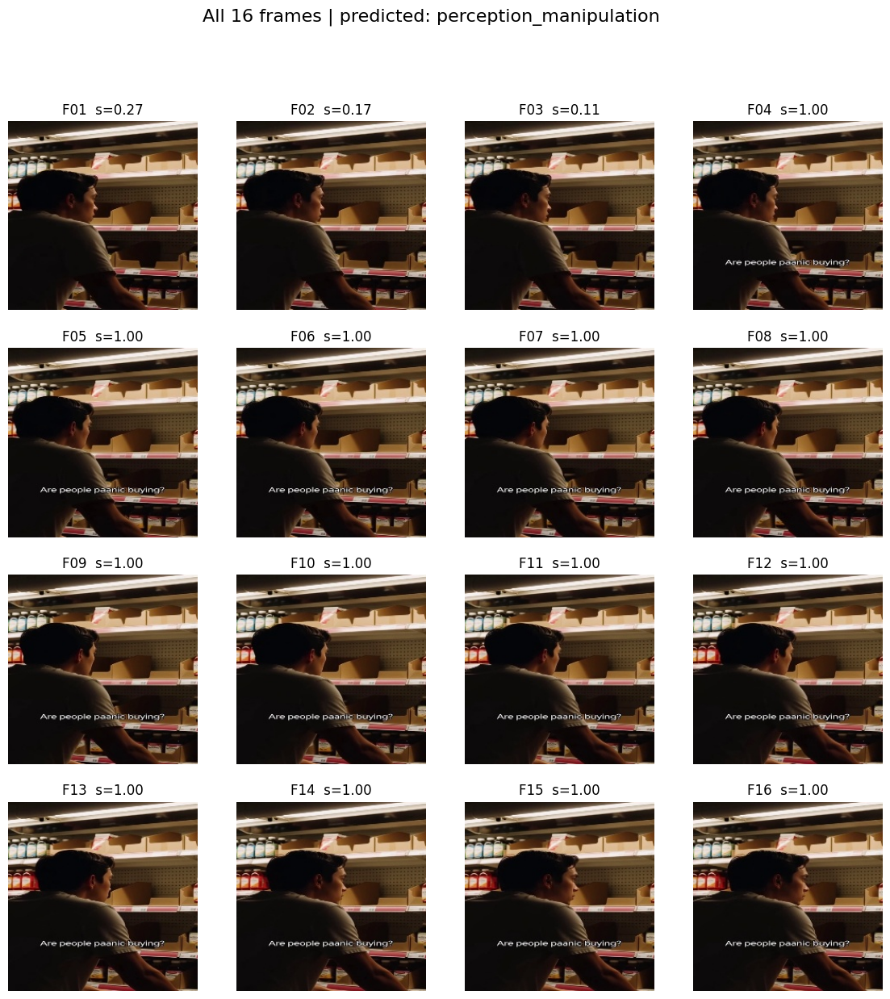


ONE-LINE EXPLANATION:
The video is misleading (perception_manipulation) because it tries to shape perception using emotional framing rather than facts (evidence from OCR: "ARE PEOPLE PAANIC BUYING") with 13/16 frames strongly supporting the decision.

Frame support: 13/16 frames >= 0.7 score


In [41]:
exp, scores16, line = run_xai("TEST_PM_099", split="test")

VIDEO: TEST_SUS_019
Pred(full): scientifically_unrealistic_scene  | prob: 0.94

Ablation (prob of predicted class):
Full (Vision+Text): 0.94
Vision only: 0.8594
Text only: 0.74
Transcript only: 0.94
OCR only: 0.8594


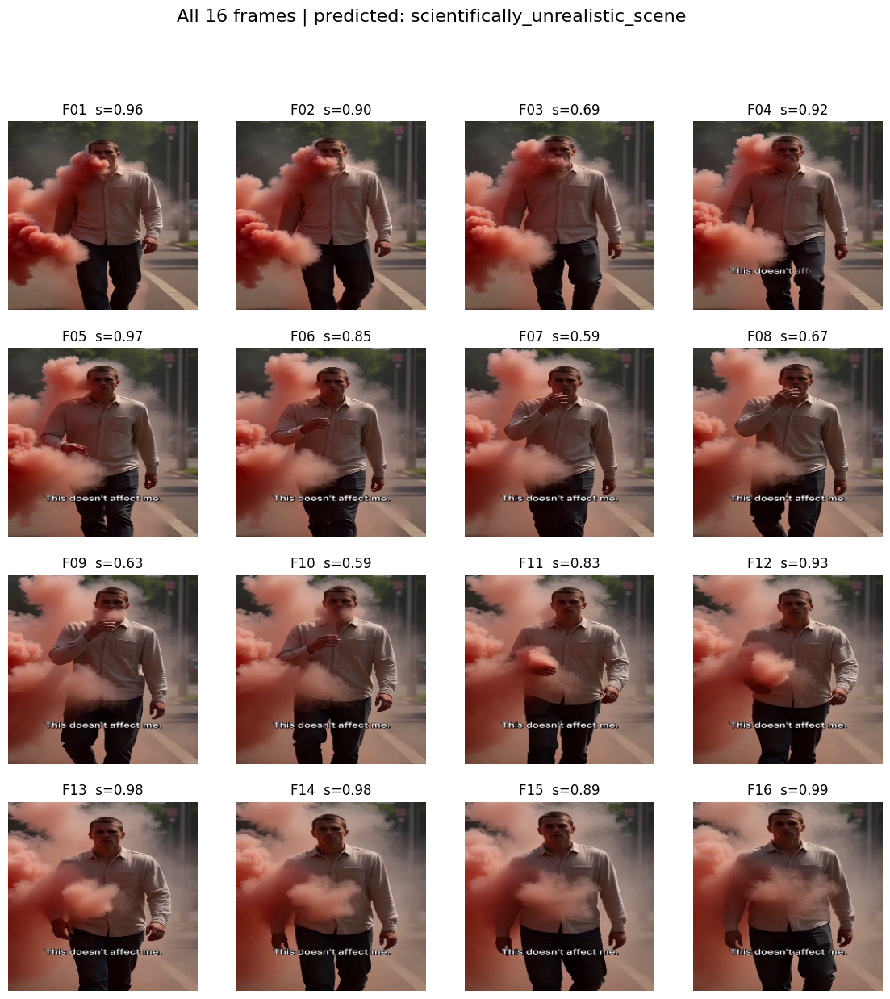


ONE-LINE EXPLANATION:
The video is misleading (scientifically_unrealistic_scene) because the scene implies behavior that violates real-world science/physics/biology (evidence from ASR: "This doesn't affect me.") with 11/16 frames strongly supporting the decision.

Frame support: 11/16 frames >= 0.7 score


In [42]:
exp, scores16, line = run_xai("TEST_SUS_019", split="test")

VIDEO: TEST_IF_012
Pred(full): identity_fabrication  | prob: 1.0

Ablation (prob of predicted class):
Full (Vision+Text): 1.0
Vision only: 1.0
Text only: 0.0181
Transcript only: 1.0
OCR only: 1.0


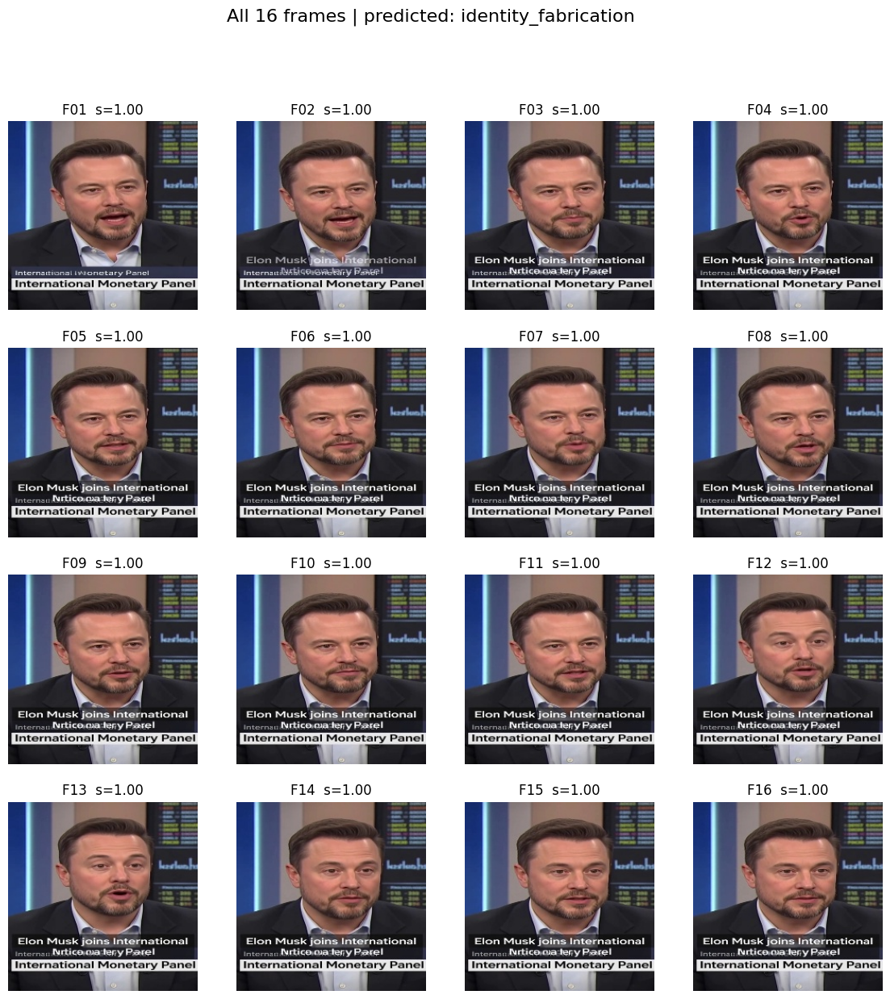


ONE-LINE EXPLANATION:
The video is misleading (identity_fabrication) because it asserts a claim without reliable grounding (evidence from OCR: "ELON MUSK JOINS INTERNATIONAL INTERNA TIO TERY PANEL INTERNATIONAL MONETARY PANEL ELON MUS") with 16/16 frames strongly supporting the decision.

Frame support: 16/16 frames >= 0.7 score


In [43]:
exp, scores16, line = run_xai("TEST_IF_012", split="test")

VIDEO: TEST_SC_054
Pred(full): surreal_content  | prob: 1.0

Ablation (prob of predicted class):
Full (Vision+Text): 1.0
Vision only: 1.0
Text only: 0.0002
Transcript only: 1.0
OCR only: 1.0


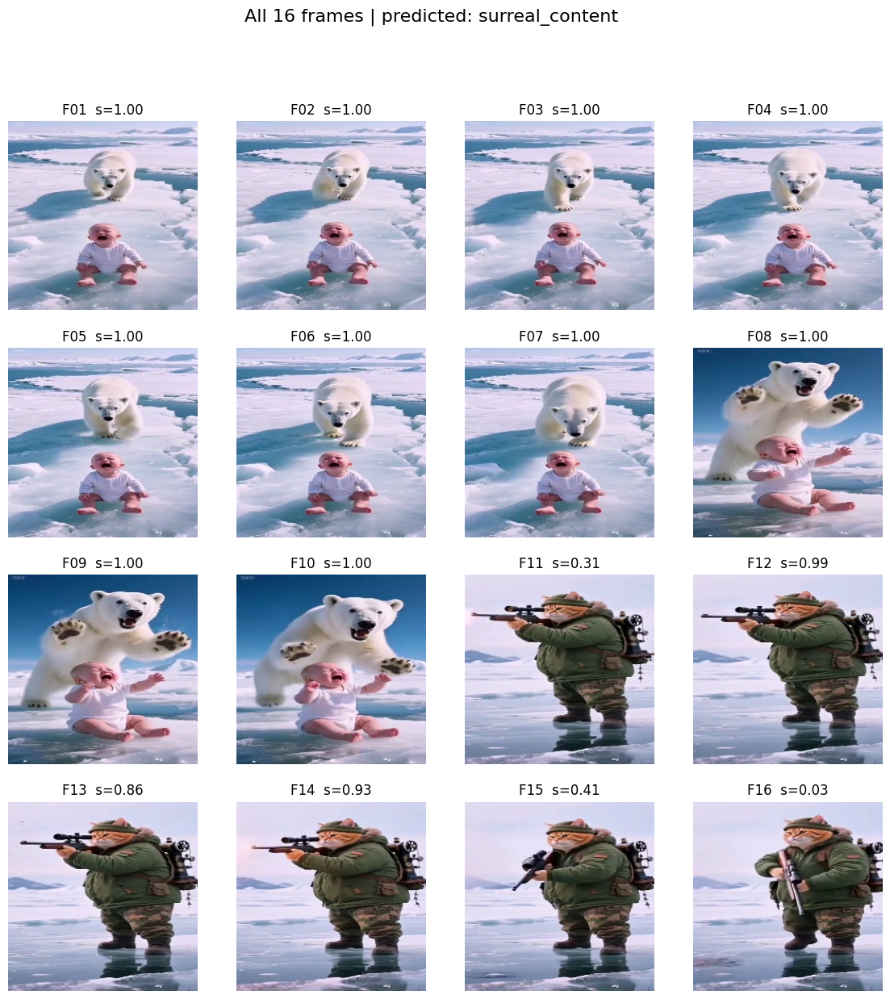


ONE-LINE EXPLANATION:
The video is misleading (surreal_content) because the visuals are stylized/unreal and not realistic (evidence from ASR: "Beep") with 13/16 frames strongly supporting the decision.

Frame support: 13/16 frames >= 0.7 score


In [44]:
exp, scores16, line = run_xai("TEST_SC_054", split="test")

VIDEO: TEST_SAFE_028
Pred(full): safe  | prob: 0.9985

Ablation (prob of predicted class):
Full (Vision+Text): 0.9985
Vision only: 0.9263
Text only: 0.0041
Transcript only: 0.999
OCR only: 0.9175


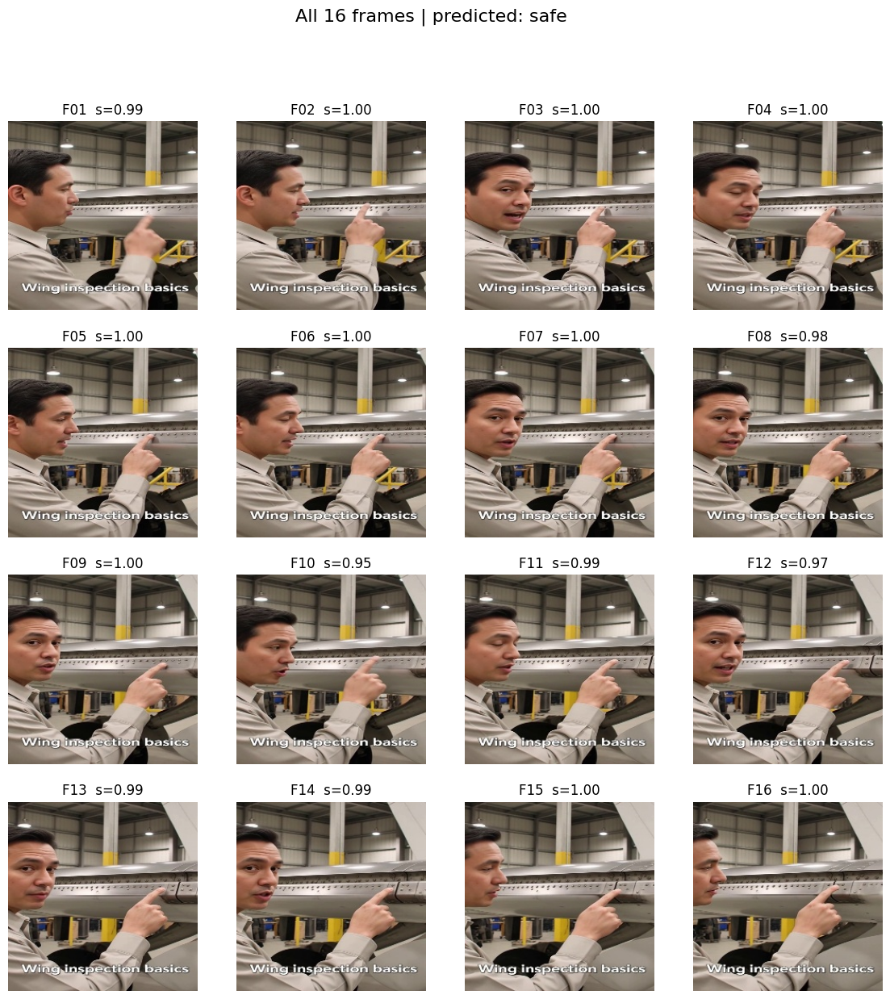


ONE-LINE EXPLANATION:
The video is safe because the visible/spoken content is neutral and consistent with the scene (evidence from OCR: "WING INSPECTION BASICS") with 16/16 frames strongly supporting the decision.

Frame support: 16/16 frames >= 0.7 score


In [45]:
exp, scores16, line = run_xai("TEST_SAFE_028", split="test")